# SEIE Survey Data Analysis 

## Table of Contents<a id="1.1_Table_of_Contents"></a>

* [1 SEIE Survey Data Analysis](#1_SEIE_Survey_Data_Analysis)
    * [1.1 Table of Contents](#1.1_Table_of_Contents)
    * [1.2 Load Data](#1.2_Load_Data)
    * [1.3 Explore Data](#1.3_Explore_Data)
    * [1.4 Basic Plots](#1.4_Basic_Plots)
    * [1.5 Word Cloud](#1.5_Word_Cloud)
    * [1.6 Count Vectorizer](#1.6_Count_Vectorizer)
    * [1.7 TF-IDF Vectorizer](#1.7_TF_-_IDF_Vectorizer)

In [1]:
# importing necessary modules for the start
import pandas as pd 
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt 
%matplotlib inline

## Load Data<a id='1.2_Load_Data'></a>

In [2]:
data = pd.read_csv('./data/SEIEsurvey.csv')

In [3]:
data.head()

,Timestamp,What ethnic group do you identify with? (Your response is optional),"Our Department does not discriminate on the basis of gender identity or expression. In order to track the effectiveness of our efforts and ensure we consider the needs of all residents of Los Angeles, please consider the following optional question: How do you gender identify?","If you chose ""Prefer to self-describe"" to the previous question, please do so here.",What Neighborhood Council are you from?,For how many years have you been a member of your NC Board?,Please select the option that best represents your point of view.,HOUSING,JOBS / BUSINESS / ECONOMIC DEVELOPMENT,"SCHOOLS, EDUCATION & ARTS / CULTURE",QUALITY OF LIFE,SOCIAL & SUPPORTIVE SERVICES / MENTAL HEALTH,PUBLIC SAFETY & EMERGENCY PREPAREDNESS,INFRASTRUCTURE & SUSTAINABILITY,"Of the categories of possible City budget initiatives listed above, which are your top 3? Please select them from this list.","Please explain why the categories you chose above are your top 3 areas of concern. Please also feel free to use this space to talk about other priorities you have for addressing racial, economic, or social inequities in the City of Los Angeles which did not appear on the list above:","What sort of programs, services, or other mechanisms could be deployed to put the initiatives you selected above into action?","How can the City best ensure that these initiatives are developed and carried out in a way that is mindful of equality, diversity, and inclusion? For example, how might community voices have input in discussions with City departments and decision makers about inclusion, equity, and social justice?",How might civic engagement be built into the development of City programs?,"Please share any other general comments, support or guidance that you might like to provide."
0,7/12/2020 0:54:17,Latino/Hispano,Male,NaN,Arleta,5-7 Years,Our communities have a high level of social an...,Cut taxes and regulations to create more jobs,"Promote business ownership, Support small busi...",Increase availability of educational/cultural ...,Recreation & wellness programs,Support non profit youth programs,Create more policing in communities,Infrastructure investment (such as street & si...,"Jobs / Business / Economic Development, School...",NaN,"Reduce taxes and regulations, school choice, m...",Ensure everyone is equal under the law,NaN,NaN
1,7/6/2020 19:56:49,Latino/Hispano,Female,NaN,Arroyo Seco,0-1 Year,Our communities have a high level of social an...,"Address rent control and evictions, Address th...","Create and promote living wage jobs, Help for ...","Youth recreation & development (youth centers,...","Address the ""digital divide"" (improve individu...",Increase access to mental health services & pr...,"Address over-policing in LA neighborhoods, Dev...",Infrastructure investment (such as street & si...,"Housing, Jobs / Business / Economic Developmen...",The housing situation in Los Angeles has racia...,Supported employment initiatives.\nScholarship...,Work with nonprofits leaders who have ties in ...,Ensuring that all programs go through communit...,NaN
2,7/7/2020 1:01:24,White/Caucasian,Male,NaN,Arroyo Seco,2-4 Years,Our communities have a moderate level economic...,"Address rent control and evictions, Address th...","Help for those seeking work, Support small bus...","Afterschool and/or child care programs, Increa...","Address the ""digital divide"" (improve individu...",Increase access to mental health services & pr...,Develop & support alternatives to armed crisis...,Infrastructure investment (such as street & si...,"Housing, Schools, Education & Arts / Culture, ...",A community is only as strong as its care and ...,"Funding for mental health services, schools an...",By establishing practices and procedures that ...,It must be part and parcel of any process that...,NaN
3,7/6/2020 21:19:29,Latino/Hispano,Male,NaN,Atwater Village,2-4 Years,Our communities have a high level of social an...,"Add

In [4]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 696 entries, 0 to 695
Data columns (total 20 columns):
 #   Column                                                                                                                                                                                                                                                                                                       Non-Null Count  Dtype 
---  ------                                                                                                                                                                                                                                                                                                       --------------  ----- 
 0   Timestamp                                                                                                                                                                                                                               

## Explore Data<a id='1.3_Explore_Data'></a>

In [5]:
data.shape

(696, 20)

In [6]:
data.describe()

,Timestamp,What ethnic group do you identify with? (Your response is optional),"Our Department does not discriminate on the basis of gender identity or expression. In order to track the effectiveness of our efforts and ensure we consider the needs of all residents of Los Angeles, please consider the following optional question: How do you gender identify?","If you chose ""Prefer to self-describe"" to the previous question, please do so here.",What Neighborhood Council are you from?,For how many years have you been a member of your NC Board?,Please select the option that best represents your point of view.,HOUSING,JOBS / BUSINESS / ECONOMIC DEVELOPMENT,"SCHOOLS, EDUCATION & ARTS / CULTURE",QUALITY OF LIFE,SOCIAL & SUPPORTIVE SERVICES / MENTAL HEALTH,PUBLIC SAFETY & EMERGENCY PREPAREDNESS,INFRASTRUCTURE & SUSTAINABILITY,"Of the categories of possible City budget initiatives listed above, which are your top 3? Please select them from this list.","Please explain why the categories you chose above are your top 3 areas of concern. Please also feel free to use this space to talk about other priorities you have for addressing racial, economic, or social inequities in the City of Los Angeles which did not appear on the list above:","What sort of programs, services, or other mechanisms could be deployed to put the initiatives you selected above into action?","How can the City best ensure that these initiatives are developed and carried out in a way that is mindful of equality, diversity, and inclusion? For example, how might community voices have input in discussions with City departments and decision makers about inclusion, equity, and social justice?",How might civic engagement be built into the development of City programs?,"Please share any other general comments, support or guidance that you might like to provide."
count,686,670,690,15,696,696,686,693,689,687,689,680,679,691,694,524,519,493,479,316
unique,683,37,7,15,98,7,7,167,199,153,272,110,169,110,126,497,493,466,449,297
top,7/10/2020 16:46:21,White/Caucasian,Male,This is ridiculous,West Hills,2-4 Years,Our communities have a high level of social an...,"Address rent control and evictions, Home owner...",Assistance with lending and financial institut...,"Address over-policing in schools, Youth recrea...","Address the ""digital divide"" (improve individu...",Increase access to mental health services & pr...,"Address over-policing in LA neighborhoods, Dev...",Infrastructure investment (such as street & si...,"Housing, Schools, Education & Arts / Culture, ...",Ultimately people's priority is safety and the...,"For schools, invest in providing equity and ac...",Language access and people who are good at com...,See above,The survey was a great start and hopefully the...
freq,2,343,337,1,20,248,299,156,100,164,103,195,155,214,62,4,4,4,5,4


In [7]:
data.columns

Index(['Timestamp',
       'What ethnic group do you identify with? (Your response is optional)',
       'Our Department does not discriminate on the basis of gender identity or expression. In order to track the effectiveness of our efforts and ensure we consider the needs of all residents of Los Angeles, please consider the following optional question: How do you gender identify?',
       'If you chose "Prefer to self-describe" to the previous question, please do so here.',
       'What Neighborhood Council are you from?',
       'For how many years have you been a member of your NC Board?',
       'Please select the option that best represents your point of view.',
       'HOUSING', 'JOBS / BUSINESS / ECONOMIC DEVELOPMENT',
       'SCHOOLS, EDUCATION & ARTS / CULTURE', 'QUALITY OF LIFE',
       'SOCIAL & SUPPORTIVE SERVICES / MENTAL HEALTH',
       'PUBLIC SAFETY & EMERGENCY PREPAREDNESS',
       'INFRASTRUCTURE & SUSTAINABILITY',
       'Of the categories of possible City budget ini

In [8]:
missing = pd.concat([data.isnull().sum(), 100 * data.isnull().mean()], axis=1)
missing.columns = ['count','%']

In [9]:
# returns the top 5 questions that have the most null values, left blank
missing.sort_values(by='%', ascending=False).head()

,count,%
"If you chose ""Prefer to self-describe"" to the previous question, please do so here.",681,97.844828
"Please share any other general comments, support or guidance that you might like to provide.",380,54.597701
How might civic engagement be built into the development of City programs?,217,31.178161
"How can the City best ensure that these initiatives are developed and carried out in a way that is mindful of equality, diversity, and inclusion? For example, how might community voices have input in discussions with City departments and decision makers about inclusion, equity, and social justice?",203,29.166667
"What sort of programs, services, or other mechanisms could be deployed to put the initiatives you selected above into action?",177,25.431034


**Avoiding redundancy from the responses**

In [10]:
data.loc[data.iloc[:,5] == "2-4 Años", data.iloc[:,5].name] ='2-4 Years'

In [11]:
data.loc[data.iloc[:,5] == '10 Años o más', data.iloc[:,5].name] ='10 years or more'

In [12]:
data.loc[data.iloc[:,2] == 'Mujer', data.iloc[:,2].name] ='Female'

In [13]:
data.loc[data.iloc[:,6] == '3', data.iloc[:,6].name] =np.nan

In [14]:
data.loc[data.iloc[:,6] == '5', data.iloc[:,6].name] =np.nan

## Basic Plots<a id='1.4_Basic_Plots'></a>

In [15]:
data.iloc[:,1].value_counts(normalize=True)

White/Caucasian                                                                          0.511940
Latino/Hispano                                                                           0.159701
Black/African American                                                                   0.135821
Asian/Pacific Islander                                                                   0.076119
Multiethnic                                                                              0.053731
Middle Eastern                                                                           0.004478
Jewish                                                                                   0.004478
Native American                                                                          0.004478
Irrelevant                                                                               0.002985
Arab American                                                                            0.002985
Armenian            

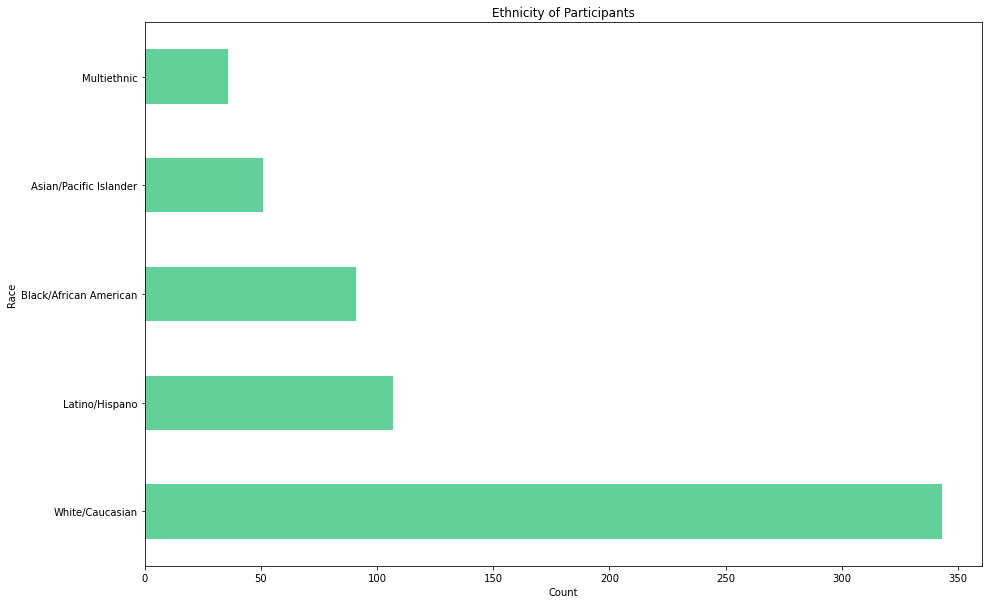

In [16]:
data.iloc[:,1].value_counts().head().plot(kind='barh', figsize=(15,10), color= '#61d199')
plt.title("Ethnicity of Participants")
plt.xlabel("Count")
plt.ylabel("Race")
plt.show()

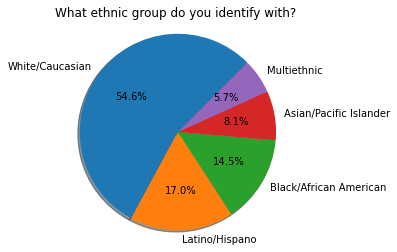

In [17]:
# pie plot 
data.iloc[:,1].value_counts().head().plot.pie(autopct='%1.1f%%', shadow=True, explode=None, startangle=45)
plt.ylabel('')
plt.axis('equal')
plt.title(data.iloc[:,1].name[0:40])
plt.show()

In [18]:
data.iloc[:,4].value_counts(normalize=True)

West Hills                   0.028736
Venice                       0.024425
Woodland Hills-Warner Ctr    0.022989
Wilshire-Center Koreatown    0.022989
Los Feliz                    0.022989
                               ...   
Harbor Gateway South         0.002874
Olympic Park                 0.002874
South Central                0.002874
North Hills East             0.002874
Studio City                  0.001437
Name: What Neighborhood Council are you from?, Length: 98, dtype: float64

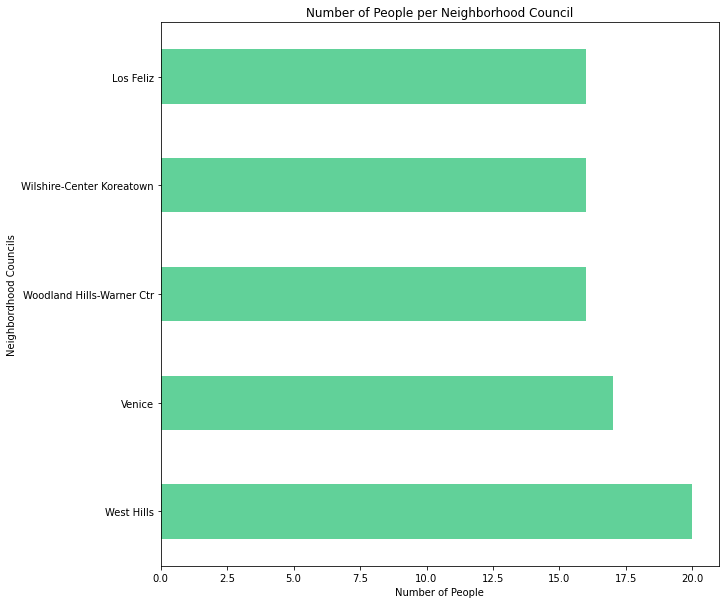

In [19]:
data.iloc[:,4].value_counts().head().plot(kind='barh', figsize=(10,10), color= '#61d199')
plt.title("Number of People per Neighborhood Council")
plt.xlabel("Number of People")
plt.ylabel("Neighbordhood Councils")
plt.show()

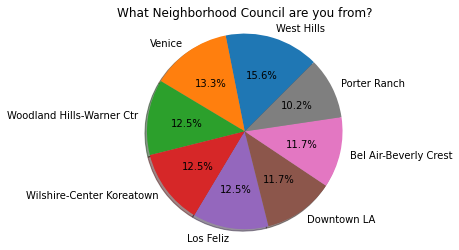

In [20]:
# pie plot 
data.iloc[:,4].value_counts().head(8).plot.pie(autopct='%1.1f%%', shadow=True, explode=None, startangle=45)
plt.ylabel('')
plt.axis('equal')
plt.title(data.iloc[:,4].name)
plt.show()

In [21]:
data.iloc[:,2].value_counts(normalize=True)

Male                                                0.488406
Female                                              0.462319
Prefer not to say                                   0.030435
Non-binary / Gender non-conforming / Genderfluid    0.008696
Trans                                               0.007246
Prefer to self-describe (please use space below)    0.002899
Name: Our Department does not discriminate on the basis of gender identity or expression. In order to track the effectiveness of our efforts and ensure we consider the needs of all residents of Los Angeles, please consider the following optional question: How do you gender identify?, dtype: float64

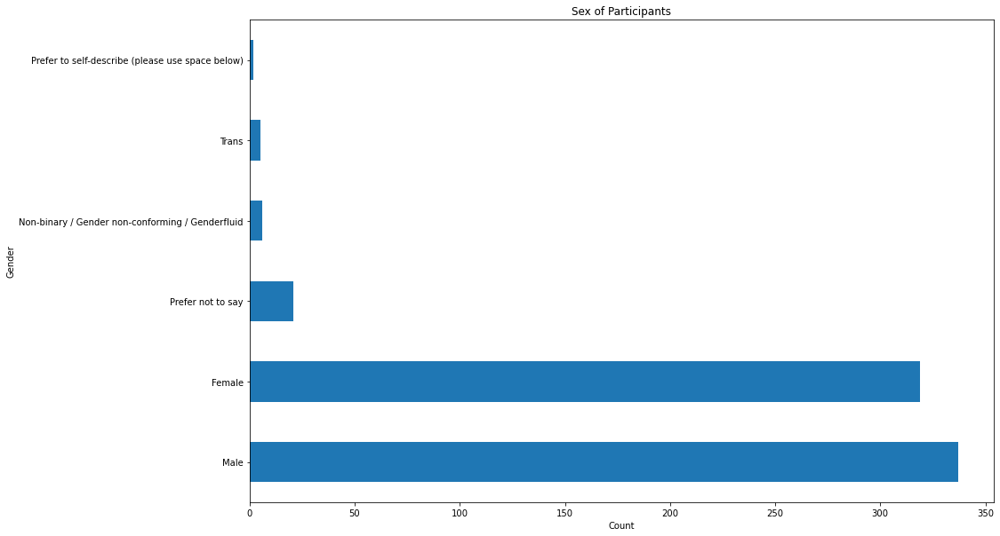

In [22]:
data.iloc[:,2].value_counts().plot(kind='barh', figsize=(15,10))
plt.title("Sex of Participants")
plt.xlabel("Count")
plt.ylabel("Gender")
plt.show()

In [23]:
data.iloc[:,2].value_counts(normalize=True)

Male                                                0.488406
Female                                              0.462319
Prefer not to say                                   0.030435
Non-binary / Gender non-conforming / Genderfluid    0.008696
Trans                                               0.007246
Prefer to self-describe (please use space below)    0.002899
Name: Our Department does not discriminate on the basis of gender identity or expression. In order to track the effectiveness of our efforts and ensure we consider the needs of all residents of Los Angeles, please consider the following optional question: How do you gender identify?, dtype: float64

In [24]:
data.iloc[:,5].value_counts()

2-4 Years           249
0-1 Year            235
5-7 Years           102
10 years or more     68
8-10 Years           42
Name: For how many years have you been a member of your NC Board?, dtype: int64

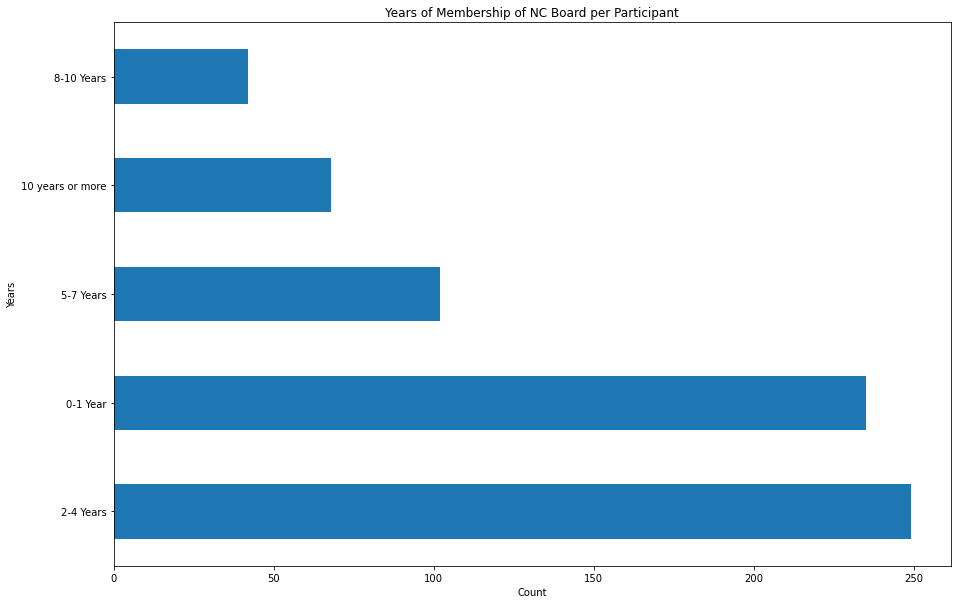

In [25]:
data.iloc[:,5].value_counts().plot(kind='barh', figsize=(15,10))
plt.title("Years of Membership of NC Board per Participant")
plt.xlabel("Count")
plt.ylabel("Years")
plt.show()

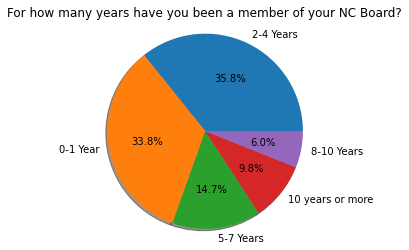

In [26]:
# pie plot 
data.iloc[:,5].value_counts().head(8).plot.pie(autopct='%1.1f%%', shadow=True, explode=None)
plt.ylabel('')
plt.axis('equal')
plt.title(data.iloc[:,5].name)
plt.show()

In [27]:
data.iloc[:,6].value_counts(normalize =True)

Our communities have a high level of social and economic disparity issues.                0.437775
Our communitites have experienced an increase in social and economic disparity issues.    0.234261
Our communities have a moderate level economic social or economic disparity issues.       0.210835
Our communities have a small level of social or economic disparity issues.                0.081991
Our communities have no social or economic disparity issues.                              0.035139
Name: Please select the option that best represents your point of view., dtype: float64

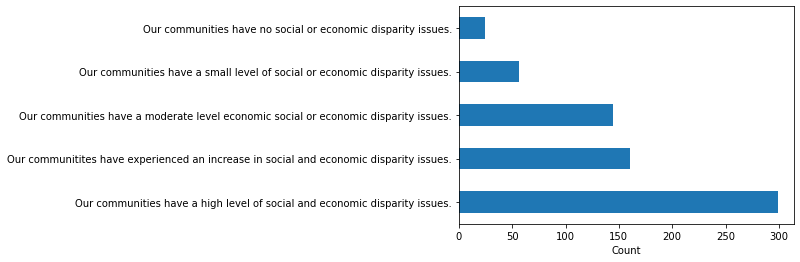

In [28]:
data.iloc[:,6].value_counts().plot(kind='barh')
plt.xlabel("Count")
plt.show()

In [29]:
df= data.fillna("")

In [30]:
df = df.apply(lambda x: x.astype(str).str.lower())

In [31]:
def wc(n):
    """
    parameter: range(1,20) 
    ignoring the first column because it is a timestamp
    returns the average number of words per response 
    """
    col = df.iloc[:,n]
    return col.str.split().apply(len).mean()

In [32]:
word_lengths = []
cols = []
for i in range(1,20):
    cols.append(i)
    word_lengths.append(wc(i))

In [33]:
wc = pd.DataFrame({'col#':cols, 'word-counts':word_lengths})

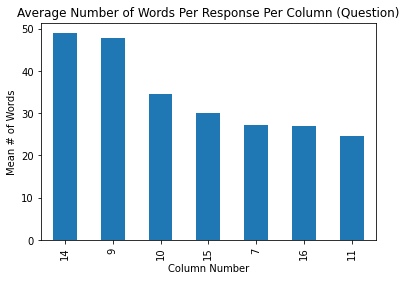

In [34]:
wc['word-counts'].sort_values(ascending=False).head(7).plot(kind='bar')
plt.title("Average Number of Words Per Response Per Column (Question)")
plt.xlabel('Column Number')
plt.ylabel("Mean # of Words")
plt.show()

## Word Cloud <a id="1.5_Word_Cloud"></a>

In [35]:
from wordcloud import WordCloud

def get_word_cloud(text):
    """
    parameter: text, doc, corpus
    returns: word cloud
    base case
    doesn't generate clouds based on weights
    """
    wordcloud = WordCloud(
        width=1000,
        height=500,
        background_color="white").generate(str(text))
    fig = plt.figure(
        figsize= (40,30), 
        facecolor = 'k', 
        edgecolor = 'k')
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis('off')
    plt.tight_layout(pad=0)
    plt.show()

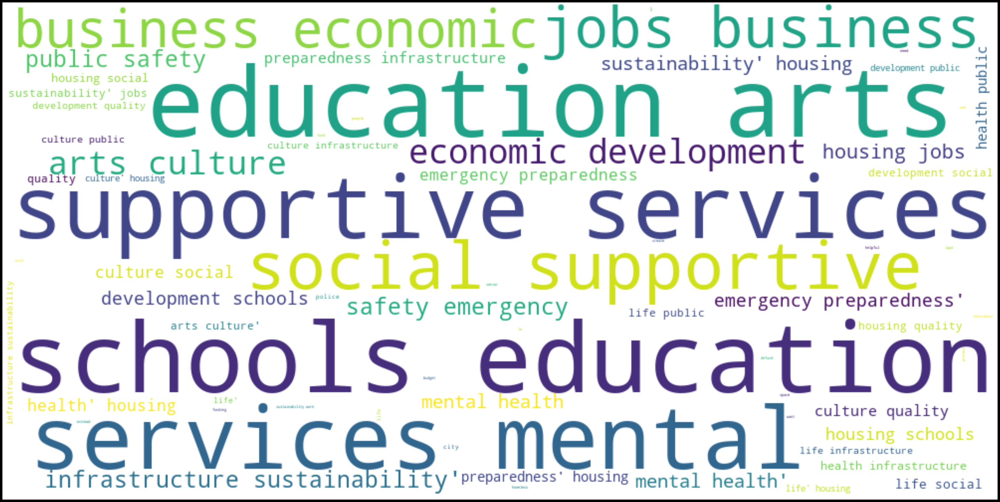

In [36]:
get_word_cloud(df.iloc[:,14].values)

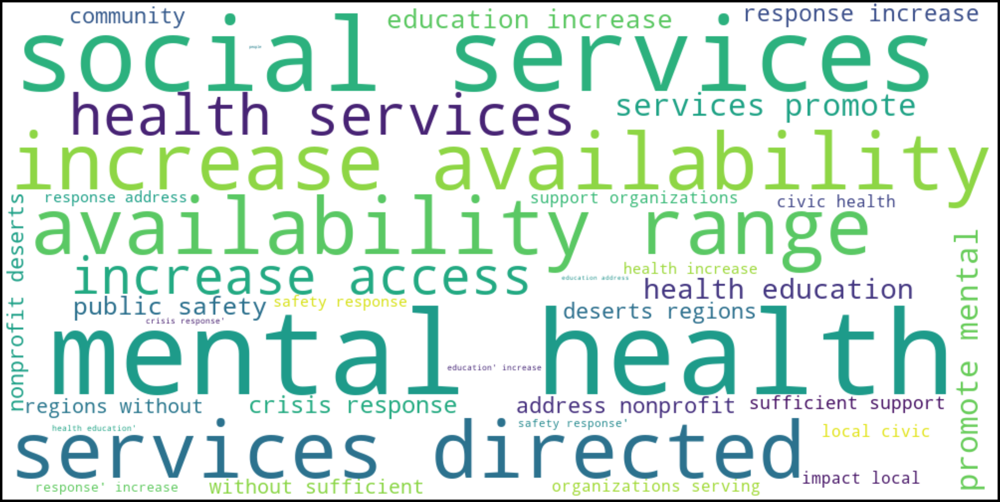

In [37]:
get_word_cloud(df.iloc[:,11].values)

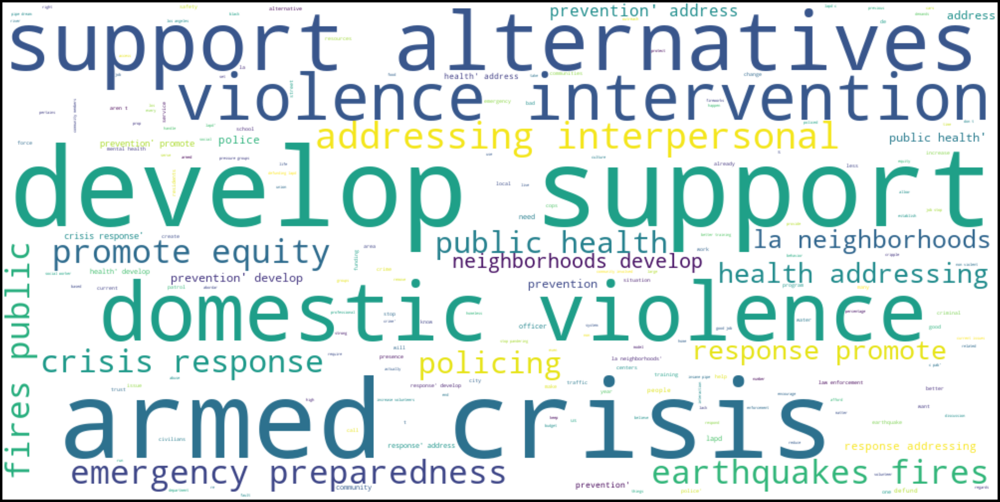

In [38]:
get_word_cloud(df.iloc[:,12].values)

## Count Vectorizer <a id="1.6_Count_Vectorizer"></a>

The purpose of Ngrams is to display any patterns between the word groupings that can identify main ideas regarding the text. Can be used for spelling correction, text summarization, and tokenizing  
Returns the frequency of words  

In [39]:
from sklearn.feature_extraction.text import CountVectorizer

**unigrams from vectorized data**

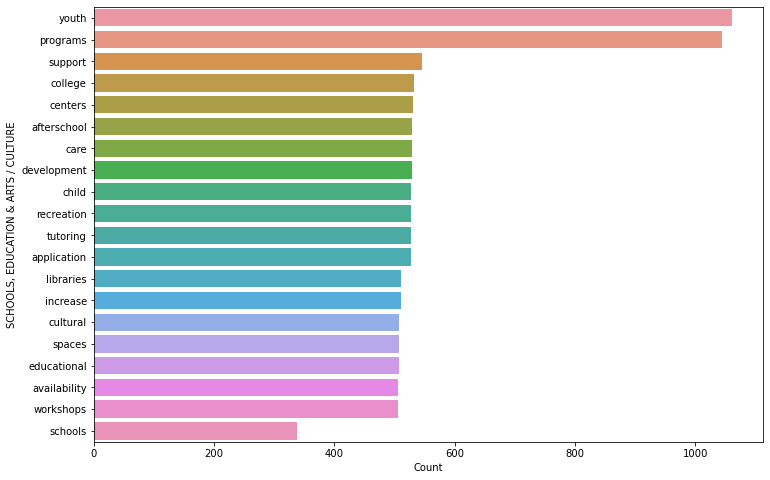

In [40]:
# the base ngram is a unigram and it returns the frequency for each word in a document
word_vectorizer = CountVectorizer(ngram_range=(1,1), analyzer= "word", stop_words='english')
sparse_matrix= word_vectorizer.fit_transform(df.iloc[:,9])
freq = sum(sparse_matrix).toarray()[0]
word = pd.DataFrame(freq, index=word_vectorizer.get_feature_names(), columns= ['frequency'])
word = word.nlargest(columns = "frequency", n=20)
plt.figure(figsize=(12,8))
ax = sns.barplot(data = word, y=word.index, x='frequency')
sns.set_context("poster")
ax.set(xlabel="Count", ylabel=df.columns[9])
plt.show()

**Bigrams from vectorized data**

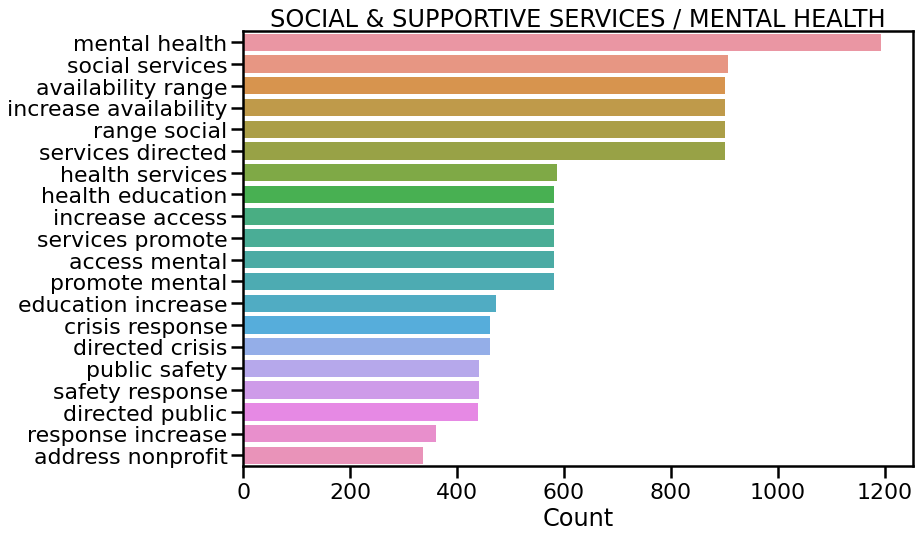

In [41]:
word_vectorizer = CountVectorizer(ngram_range=(2,2), analyzer= "word", stop_words="english")
sparse_matrix= word_vectorizer.fit_transform(df.iloc[:,11])
freq = sum(sparse_matrix).toarray()[0]
word = pd.DataFrame(freq, index=word_vectorizer.get_feature_names(), columns= ['frequency'])
word = word.nlargest(columns = "frequency", n=20)
plt.figure(figsize=(12,8))
ax = sns.barplot(data = word, y=word.index, x='frequency')
sns.set_context("poster")
ax.set(xlabel="Count", title=df.columns[11])
plt.show()
##  plt.savefig('books_read.png')

In [42]:
def count_vec(corpus, x=2, y=2):
    """
    parameters: text corpus, in our case all the responses to a column(question)
    returns: bar plot of bigrams (pairs of words) that appear most frequent
    ngrams explained: https://kavita-ganesan.com/what-are-n-grams/
    
    """
    word_vectorizer = CountVectorizer(ngram_range=(x,y), analyzer= "word", stop_words="english")
    sparse_matrix= word_vectorizer.fit_transform(corpus)
    freq = sum(sparse_matrix).toarray()[0]
    word = pd.DataFrame(freq, index=word_vectorizer.get_feature_names(), columns= ['frequency'])
    word = word.nlargest(columns = "frequency", n=20)
    plt.figure(figsize=(12,8))
    ax = sns.barplot(data = word, y=word.index, x='frequency')
    sns.set_context("poster")
    ax.set(xlabel="Count")
    print(corpus.name)
    plt.show()

Please share any other general comments, support or guidance that you might like to provide. 


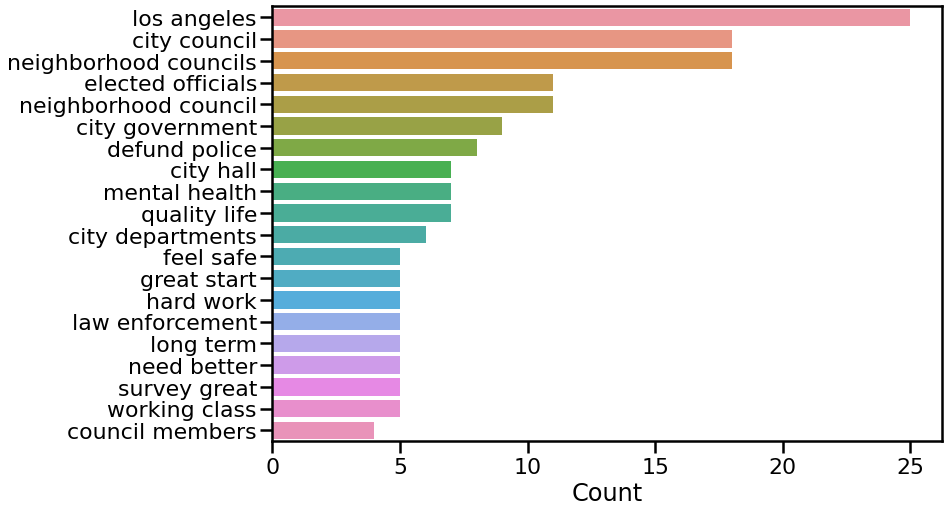

In [43]:
count_vec(df.iloc[:,19])

How might civic engagement be built into the development of City programs?


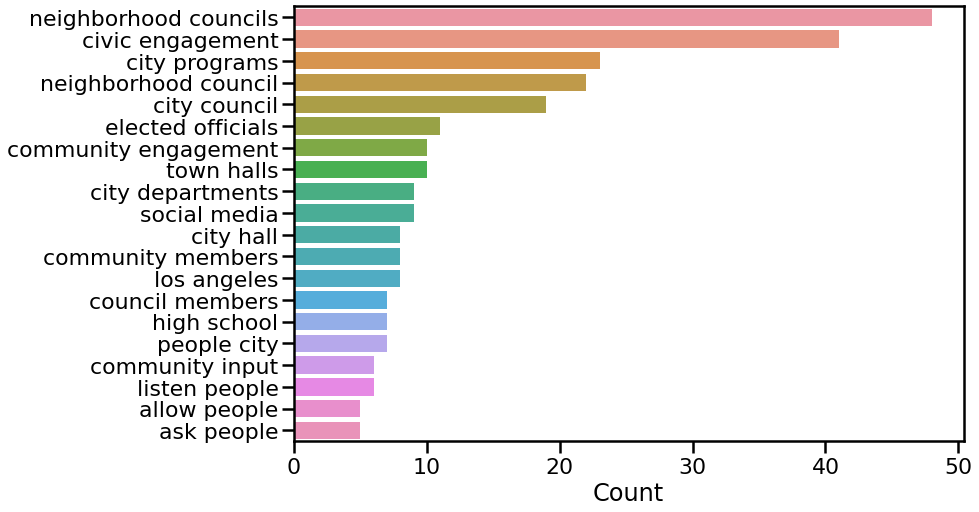

In [44]:
count_vec(df.iloc[:,18])

INFRASTRUCTURE & SUSTAINABILITY


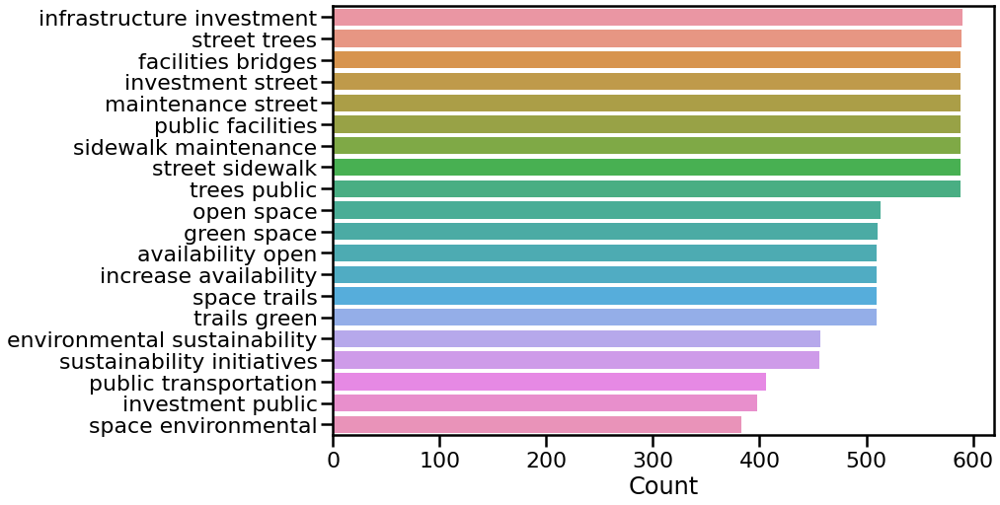

In [45]:
count_vec(df.iloc[:,13])

QUALITY OF LIFE


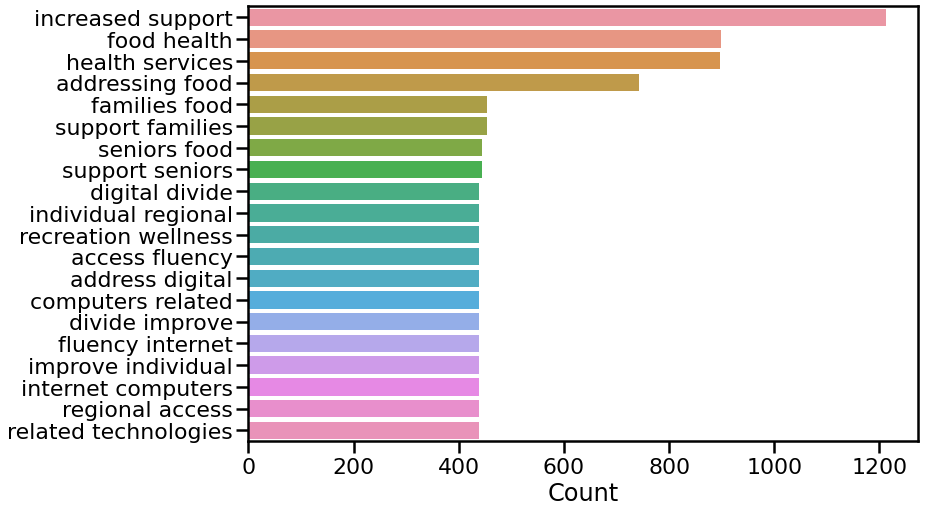

In [46]:
count_vec(df.iloc[:,10])

PUBLIC SAFETY & EMERGENCY PREPAREDNESS


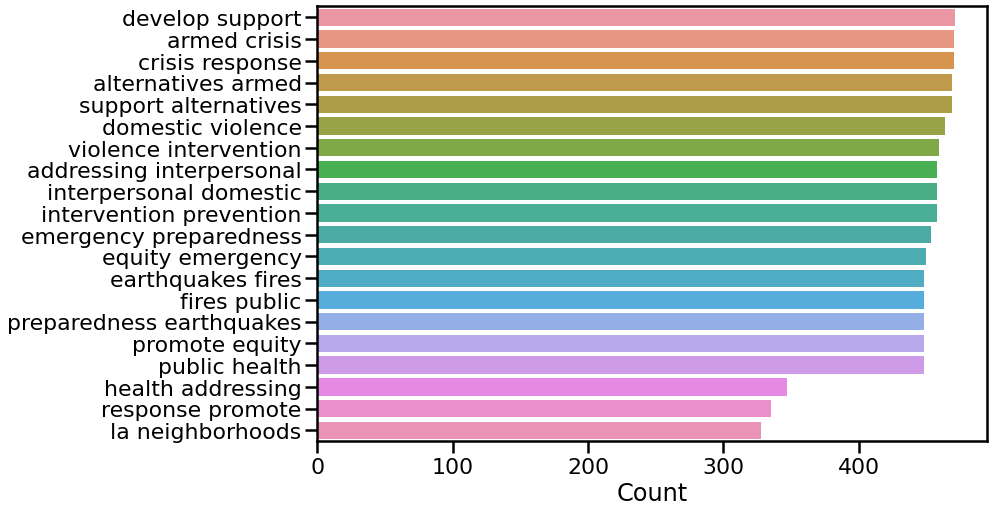

In [47]:
count_vec(df.iloc[:,12])

Please explain why the categories you chose above are your top 3 areas of concern. Please also feel free to use this space to talk about other priorities you have for addressing racial, economic, or social inequities in the City of Los Angeles which did not appear on the list above:


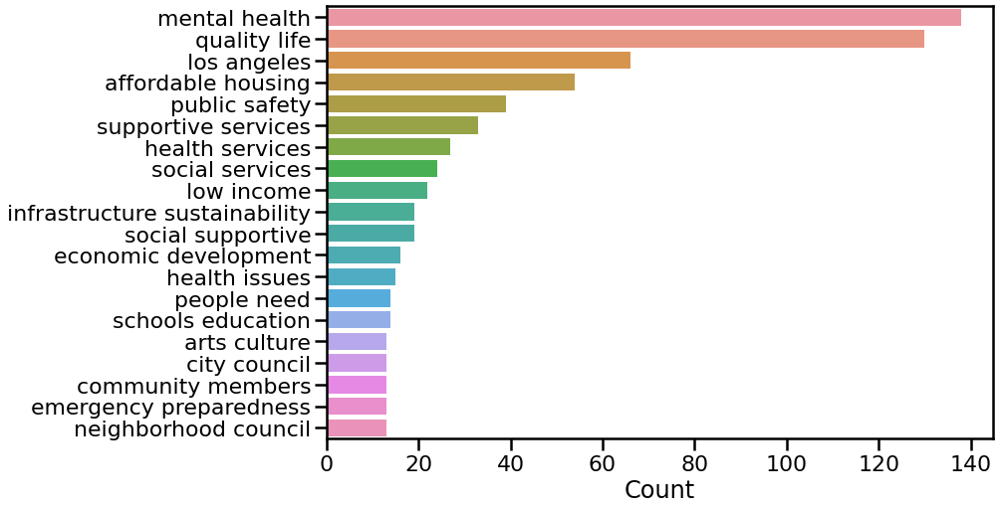

In [48]:
count_vec(df.iloc[:,15])

What sort of programs, services, or other mechanisms could be deployed to put the initiatives you selected above into action? 


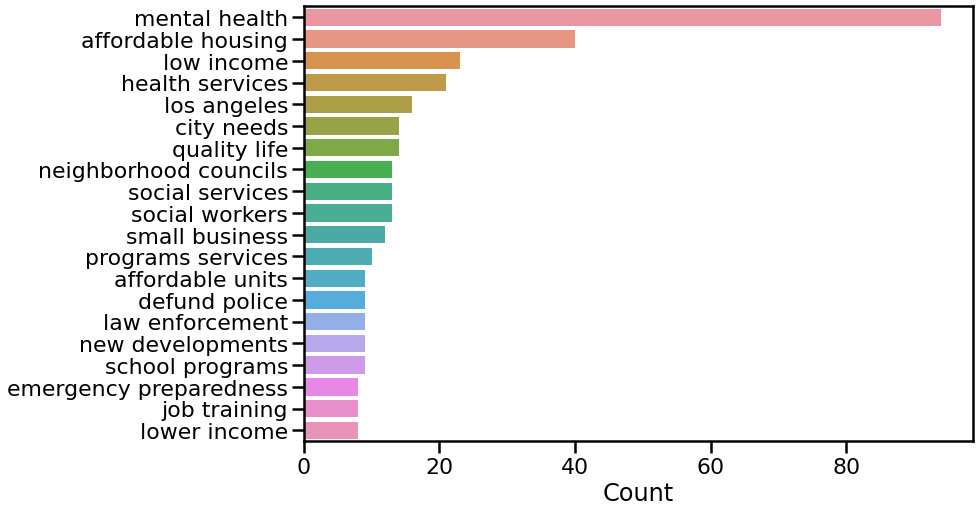

In [49]:
count_vec(df.iloc[:,16])

How can the City best ensure that these initiatives are developed and carried out in a way that is mindful of equality, diversity, and inclusion? For example, how might community voices have input in discussions with City departments and decision makers about inclusion, equity, and social justice? 


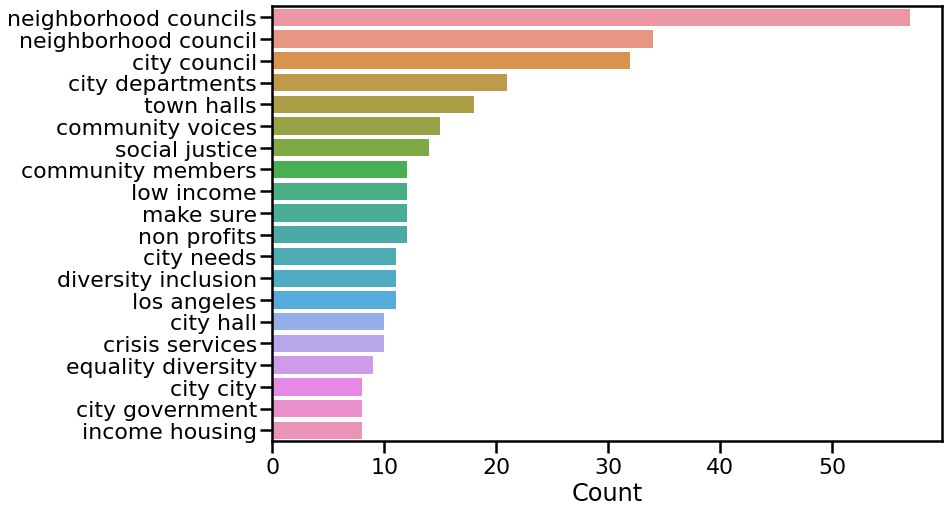

In [50]:
count_vec(df.iloc[:,17])

How might civic engagement be built into the development of City programs?


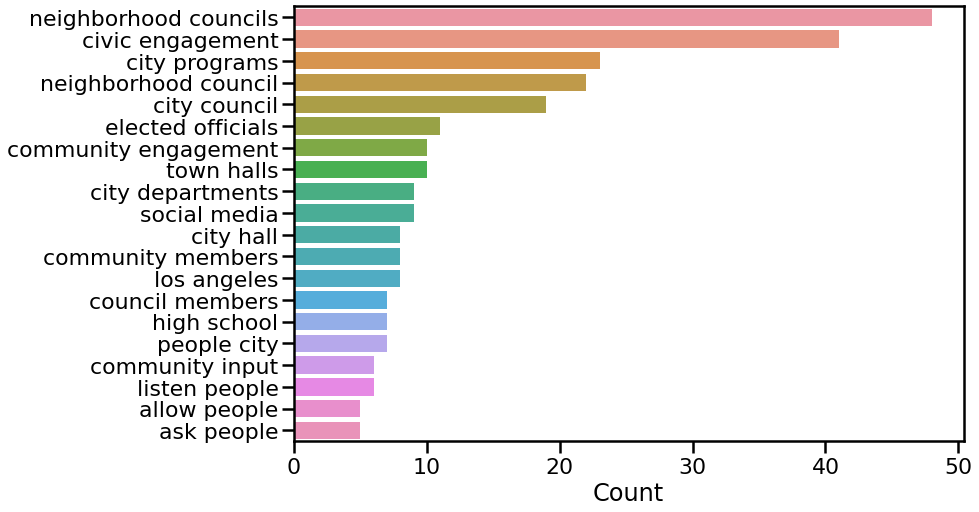

In [51]:
count_vec(df.iloc[:,18])

Please share any other general comments, support or guidance that you might like to provide. 


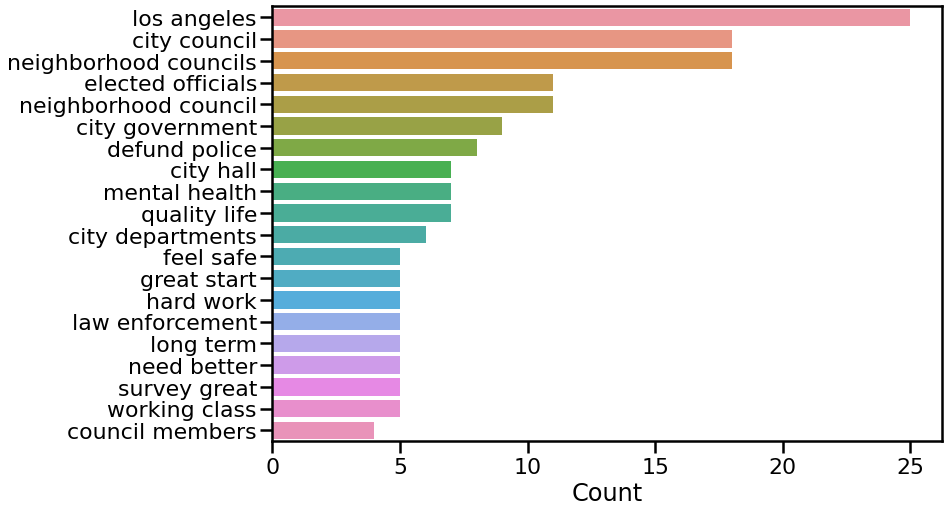

In [52]:
count_vec(df.iloc[:,19])

SCHOOLS, EDUCATION & ARTS / CULTURE


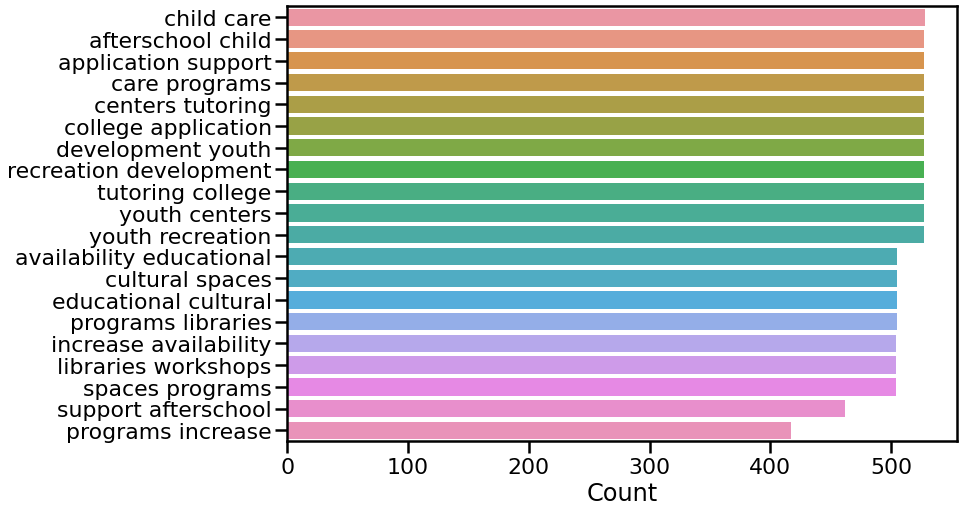

In [53]:
count_vec(df.iloc[:,9])

In [54]:
df.iloc[:,13].value_counts()

infrastructure investment (such as street & sidewalk maintenance, street trees, public facilities, bridges), investment in public transportation, increase availability of open space (e.g. trails, green space), environmental/sustainability initiatives                                                                                                                                                                                                   214
infrastructure investment (such as street & sidewalk maintenance, street trees, public facilities, bridges), increase availability of open space (e.g. trails, green space), environmental/sustainability initiatives                                                                                                                                                                                                                                         73
infrastructure investment (such as street & sidewalk maintenance, street trees, public facilities, bri

## TF-IDF Vectorizer<a id="TF_-_IDF_Vectorizer"></a>

**Purpose**: extract features from text  
machines can only work with numerical values  
  
**Term Frequency * Inverse Document Frequency** 
  
* Term Frequency: number of times a word, w appears in a document, d 
* Document Frequency: number of documents where the term appears in  


**Simple Explanation/Example for TF-IDF**  

sent1: good day  
sent2: good night   
sent3: day night good   

TF = $$ (number of repetition of words in a sentence) / (# of words in a sentence) $$  
IDF = $$ log((# of sentences)/(# of sentences containing words)) $$  

**Term Frequency**  
  
Words | Sent1 | Sent2 | Sent3 |
:-------------------|:---------------|:--------------------:|--------------------:|
**good**       | $$ 1/2 $$   | $$ 1/2 $$ | $$ 1/3 $$
**day**        | $$ 1/2 $$   | $$ 0 $$   | $$ 1/3 $$
**night**      | $$ 0 $$     | $$ 1/2 $$ | $$ 1/3 $$ 
  
$$ * $$  

**Inverse Document Frequency** 
  
  
Words | IDF
:-------------------|--------------------:
**good**       |  $$ log(3/3) = 0 $$
**day**        |  $$ log(3/2) $$
**night**      |  $$ log(3/2) $$
  
$$ = $$  
  
    
sentences | good | day | night |     
:-------------------|:---------------|:--------------------:|--------------------:|
**sent1**       | $$ 0 $$  |  $$ 1/2 * log(3/2) $$ | $$ 0 $$ |
**sent2**       | $$ 0 $$  | $$ 0  $$              | $$ 1/2 * log(3/2) $$   
**sent3**       | $$ 0 $$  |  $$ 1/3 * log(3/2) $$ | $$ 1/3 * log(3/3) $$   
  

We are trying to extract semantic meaning from each sentence, notice how the words 'day' and 'night' have more value than the adjective 'good' from the third sentence. (This is just a base level explanation)    
  
**Resources:**  
* https://scikit-learn.org/stable/modules/feature_extraction.html
* https://www.youtube.com/watch?v=D2V1okCEsiE
* https://www.youtube.com/watch?v=4vT4fzjkGCQ
* https://www.oreilly.com/library/view/applied-text-analysis/9781491963036/ch04.html

In [55]:
from sklearn.feature_extraction.text import TfidfVectorizer
#from sklearn.feature_extraction.text import TfidfTransformer

In [56]:
def create_cloud(docs):
    """
    
    parameters: corpus (all responses for a particular question/topic)
    returns: word clouds based on weights
    
    """
    title = docs.name
    # calculates the weight for each word 
    vectorizer = TfidfVectorizer(analyzer="word",  min_df=0, stop_words='english')
    tfidf_matrix= vectorizer.fit_transform(docs.values)
    feature_names = vectorizer.get_feature_names()
    dense = tfidf_matrix.todense()
    denselist = dense.tolist()
    tfidf_df = pd.DataFrame(denselist, columns=feature_names)
 
    # takes in weights and outputs a wordcloud
    cloud = WordCloud(background_color="white", max_words=50).generate_from_frequencies(tfidf_df.T.sum(axis=1))
    fig = plt.figure(
        figsize= (30,20), 
        facecolor = 'k', 
        edgecolor = 'k')
    plt.imshow(cloud, interpolation='bilinear')
    plt.axis('off')
    plt.tight_layout(pad=0)
    print(title) # better for visual purposes
    #plt.title("{}".format(title), color= 'black', backgroundcolor='white', fontweight=50, fontsize=30)
    plt.show()

In [57]:
def get_sorted_weights(docs):
    """
    
    similar to word cloud function, but instead returns a sorted list of weighted values respective to each word
    paramters: corpus, document, sentence
    returns: sorted list of top 15 words with their weights
    
    https://stackoverflow.com/questions/45805493/sorting-tfidfvectorizer-output-by-tf-idf-lowest-to-highest-and-vice-versa
    
    """
    vectorizer = TfidfVectorizer(analyzer="word",  min_df=0, stop_words='english')
    tfidf_matrix= vectorizer.fit_transform(docs.values)

    words = vectorizer.get_feature_names()

    totals = tfidf_matrix.sum(axis=0)

    data = []
    for col, word in enumerate(words):
        data.append( (word, totals[0,col] ))

    ranking = pd.DataFrame(data, columns=['word','rank'])
    print(docs.name)
    print(ranking.sort_values('rank', ascending=False).head(5))

In [58]:
get_sorted_weights(df.iloc[:,14])

Of the categories of possible City budget initiatives listed above, which are your top 3? Please select them from this list.
          word        rank
165    housing  115.074458
109  education   98.495039
316    schools   98.180872
80     culture   98.041190
15        arts   97.971203


Of the categories of possible City budget initiatives listed above, which are your top 3? Please select them from this list.


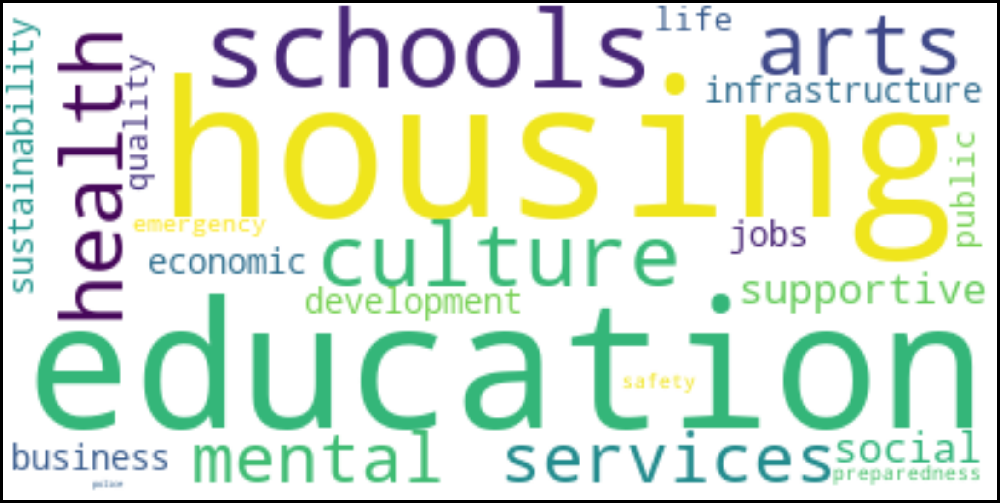

In [59]:
create_cloud(df.iloc[:,14])

INFRASTRUCTURE & SUSTAINABILITY


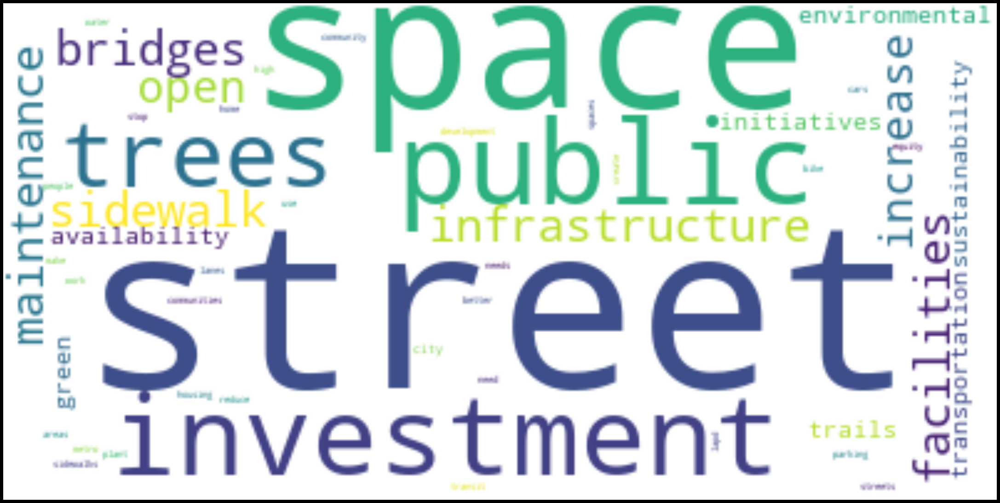

In [60]:
create_cloud(df.iloc[:,13])

In [61]:
get_sorted_weights(df.iloc[:,13])

INFRASTRUCTURE & SUSTAINABILITY
           word        rank
614      street  214.591658
597       space  201.080973
514      public  166.752043
338  investment  166.144639
660       trees  107.756012


PUBLIC SAFETY & EMERGENCY PREPAREDNESS


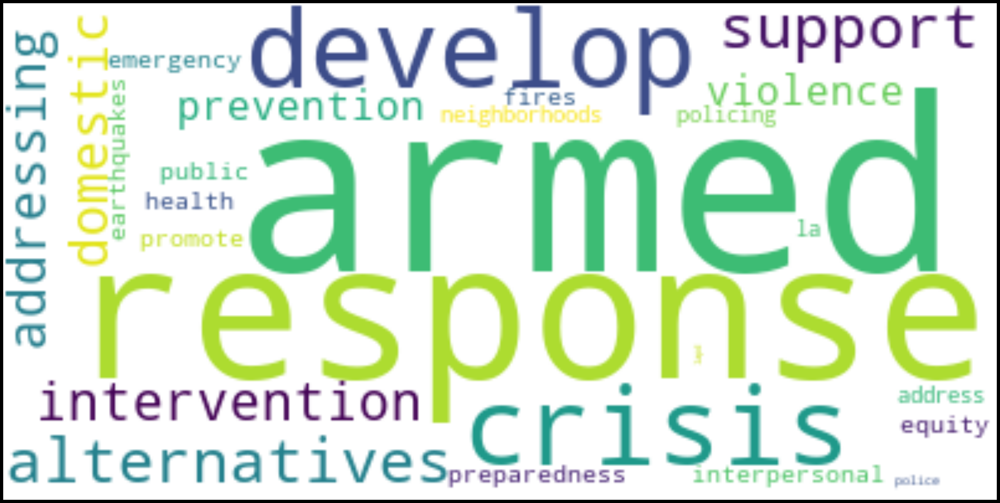

In [62]:
create_cloud(df.iloc[:,12])

SOCIAL & SUPPORTIVE SERVICES / MENTAL HEALTH


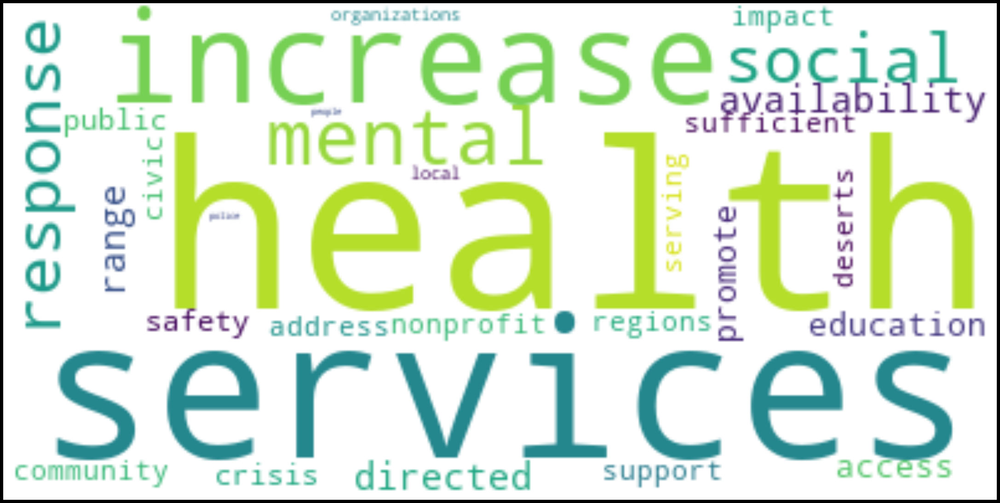

In [63]:
create_cloud(df.iloc[:,11])

What sort of programs, services, or other mechanisms could be deployed to put the initiatives you selected above into action? 


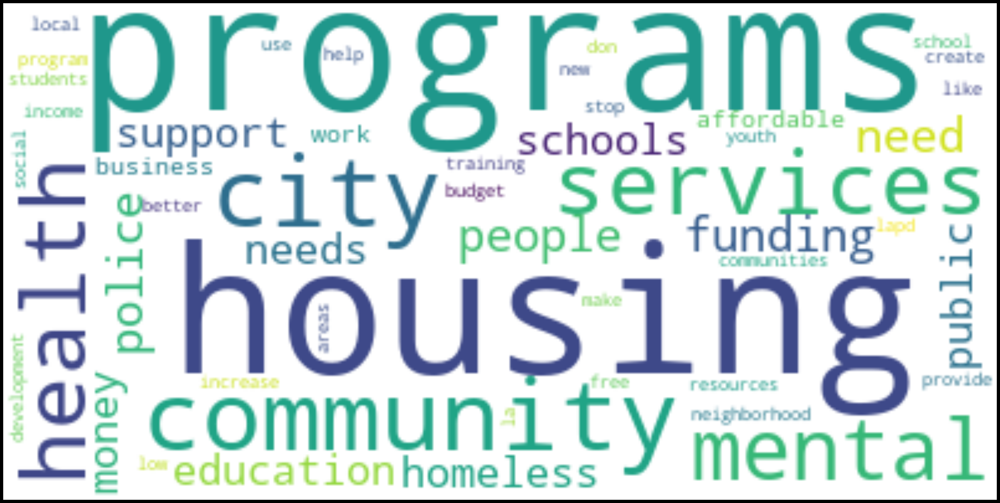

In [64]:
create_cloud(df.iloc[:,16])

In [65]:
get_sorted_weights(df.iloc[:,16])

What sort of programs, services, or other mechanisms could be deployed to put the initiatives you selected above into action? 
           word       rank
1342    housing  19.370849
2143   programs  19.123069
532   community  17.041686
473        city  15.790924
2511   services  13.363894


How can the City best ensure that these initiatives are developed and carried out in a way that is mindful of equality, diversity, and inclusion? For example, how might community voices have input in discussions with City departments and decision makers about inclusion, equity, and social justice? 


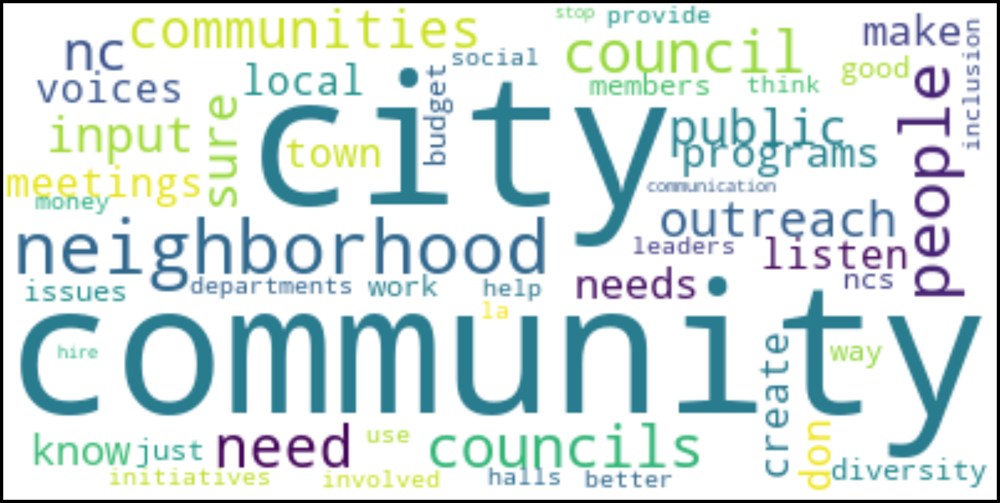

In [66]:
create_cloud(df.iloc[:,17])

In [67]:
get_sorted_weights(df.iloc[:,17])

How can the City best ensure that these initiatives are developed and carried out in a way that is mindful of equality, diversity, and inclusion? For example, how might community voices have input in discussions with City departments and decision makers about inclusion, equity, and social justice? 
              word       rank
482      community  24.065937
422           city  23.107383
1596  neighborhood  17.777620
1725        people  13.971444
585       councils  10.977791


How might civic engagement be built into the development of City programs?


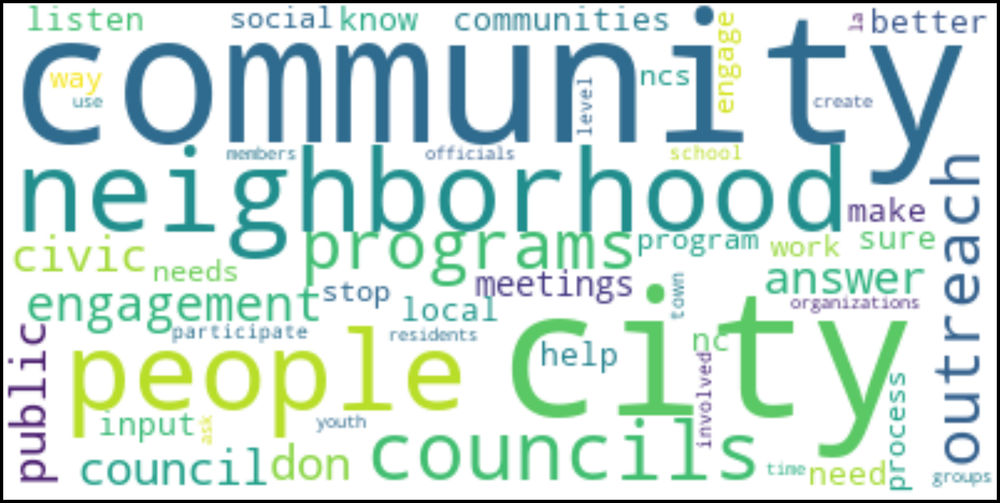

In [68]:
create_cloud(df.iloc[:,18])

In [69]:
get_sorted_weights(df.iloc[:,18])

How might civic engagement be built into the development of City programs?
              word       rank
376      community  20.854613
323           city  19.790907
1272  neighborhood  15.849975
1391        people  14.987229
437       councils  12.099193


Please share any other general comments, support or guidance that you might like to provide. 


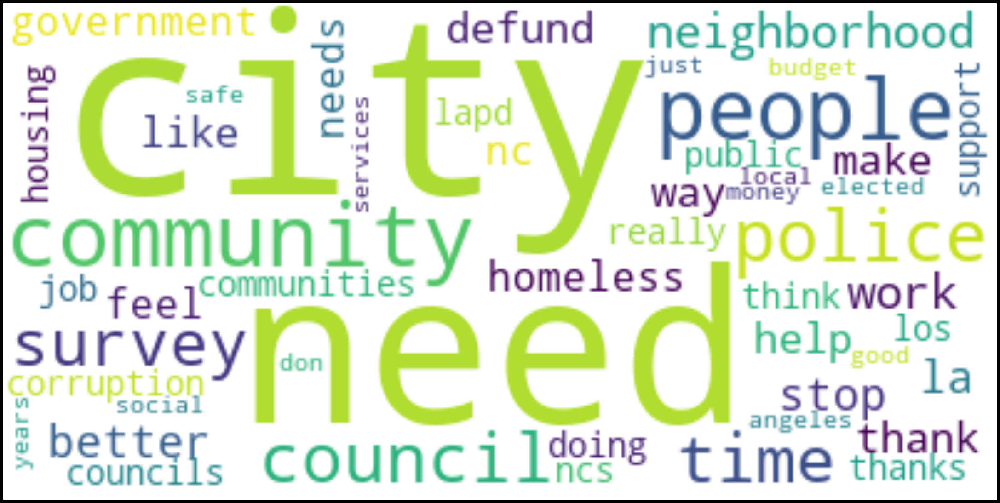

In [70]:
create_cloud(df.iloc[:,19])

In [71]:
get_sorted_weights(df.iloc[:,19])

Please share any other general comments, support or guidance that you might like to provide. 
           word       rank
360        city  16.779805
1387       need  11.873760
408   community  10.900085
1527     people  10.161855
1568     police   6.907319


In [72]:
get_sorted_weights(df.iloc[:,15])

Please explain why the categories you chose above are your top 3 areas of concern. Please also feel free to use this space to talk about other priorities you have for addressing racial, economic, or social inequities in the City of Los Angeles which did not appear on the list above:
         word       rank
1726  housing  23.675995
2322     need  23.232535
586      city  19.617164
2070     life  18.702491
2540   people  17.882045


Please explain why the categories you chose above are your top 3 areas of concern. Please also feel free to use this space to talk about other priorities you have for addressing racial, economic, or social inequities in the City of Los Angeles which did not appear on the list above:


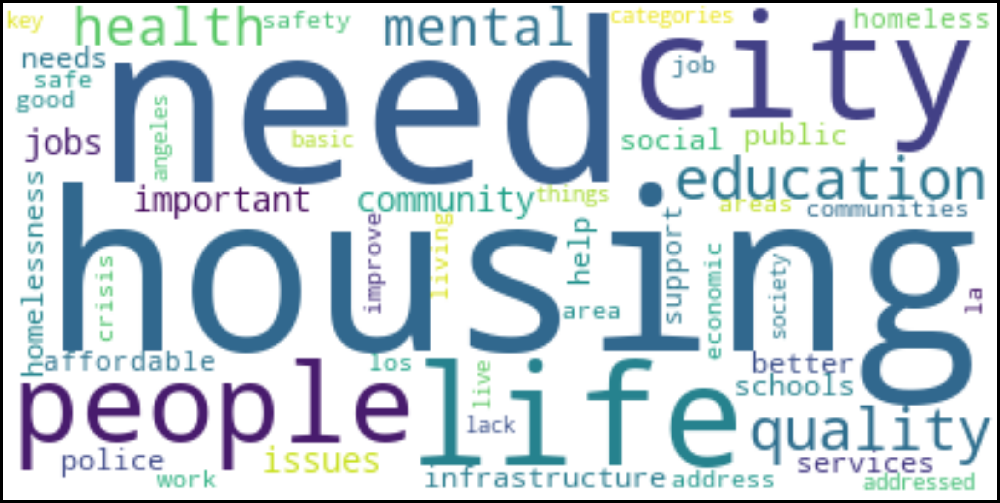

In [73]:
create_cloud(df.iloc[:, 15])

QUALITY OF LIFE


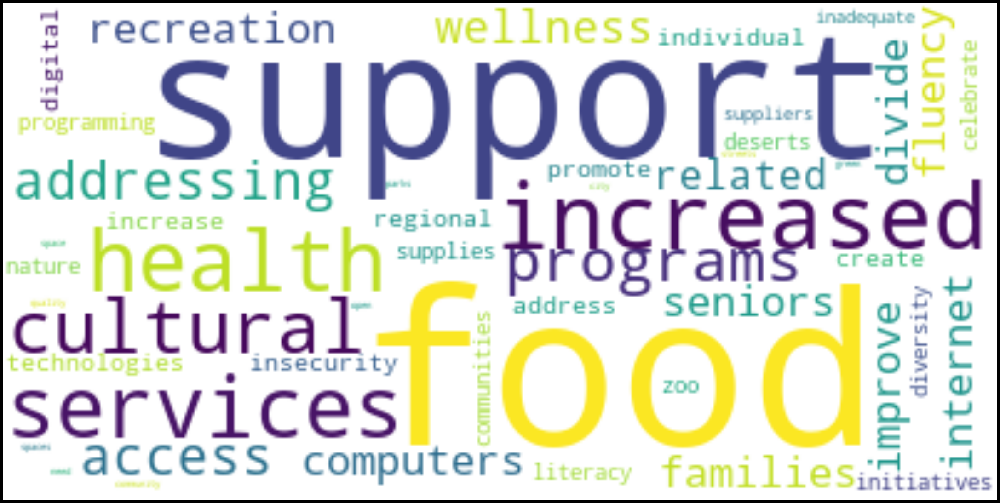

In [74]:
create_cloud(df.iloc[:,10])

SCHOOLS, EDUCATION & ARTS / CULTURE


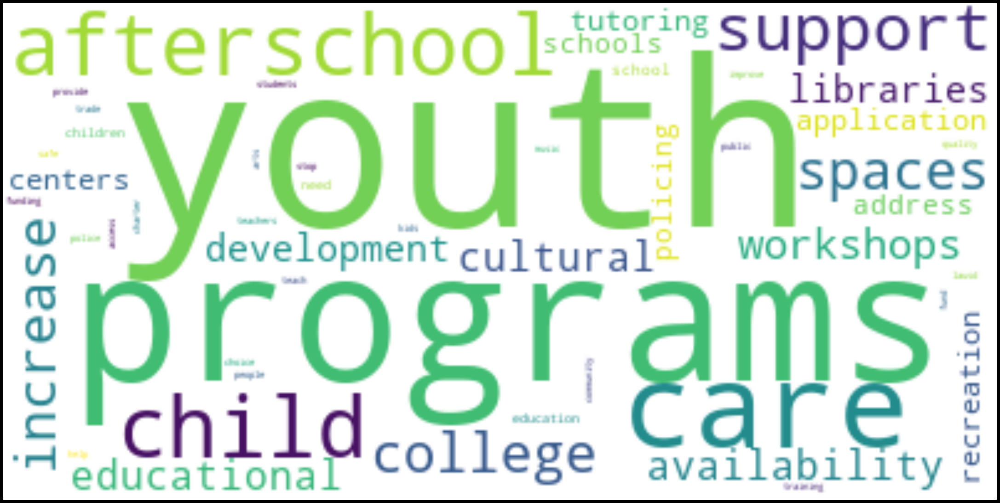

In [75]:
create_cloud(df.iloc[:,9])

JOBS / BUSINESS / ECONOMIC DEVELOPMENT


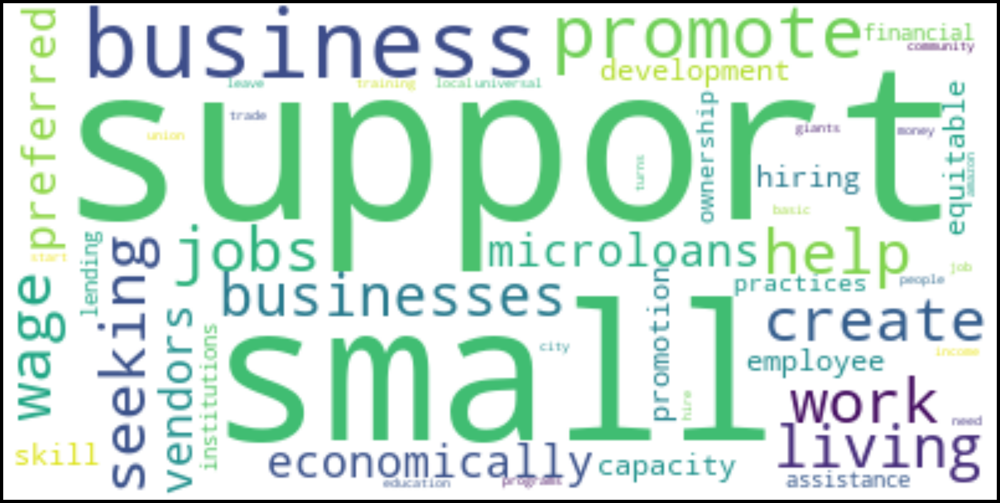

In [76]:
create_cloud(df.iloc[:,8])

HOUSING


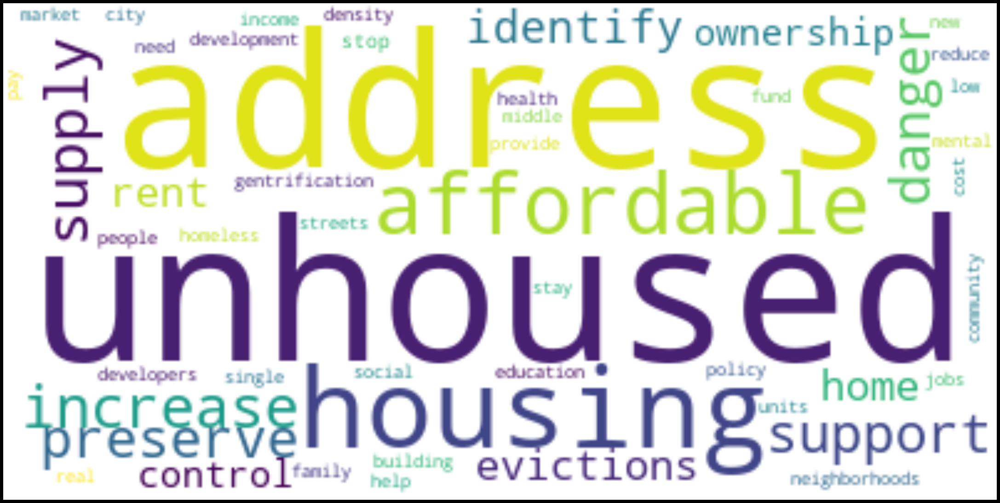

In [77]:
create_cloud(df.iloc[:,7])